# Impacts to groundwater quality from produced water disposal in Kern County, California
### Author: Valerie Petela LBNL, CSU Sacramento
### California Water Data Challenge: Intro to Jupyter for Water Data Analysis July 16, 2018
Welcome! This notebook will walk through some simple visualizations and analysis of groundwater quality data for Kern County, CA where the majority of oil and gas production occurs in the state. 

## What is produced water?
Following the implementation of Senate Bill 4, Lawrence Berkeley National Laboratory conducted an independent scientifc study of well stimulation in California. During this study, they discovered a data and research gap regarding produced water disposal ponds for oil and gas production. For every barrel of oil produced, there are 17 barrels of water produced with it. Some of this water is disposed into unlined ponds specifically created for water to evaporate or percolate into the subsurface. Produced water typically ranges from 10,000-30,000 mg/L total dissolved solids (TDS) which is much higher than the EPA secondary drinking standard of 500mg/L. Percolating water of high TDS may be contaminating fresher groundwater below.
<p>  This notebook is the beginning of a study to assess if the produced water disposal ponds have an impact on groundwater quality specifically looking at TDS. 

## Import libraries

In [1]:
from IPython.display import Image
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.basemap import Basemap
from matplotlib import cm
import matplotlib as mpl
import csv

Map of California with Kern County shaded red

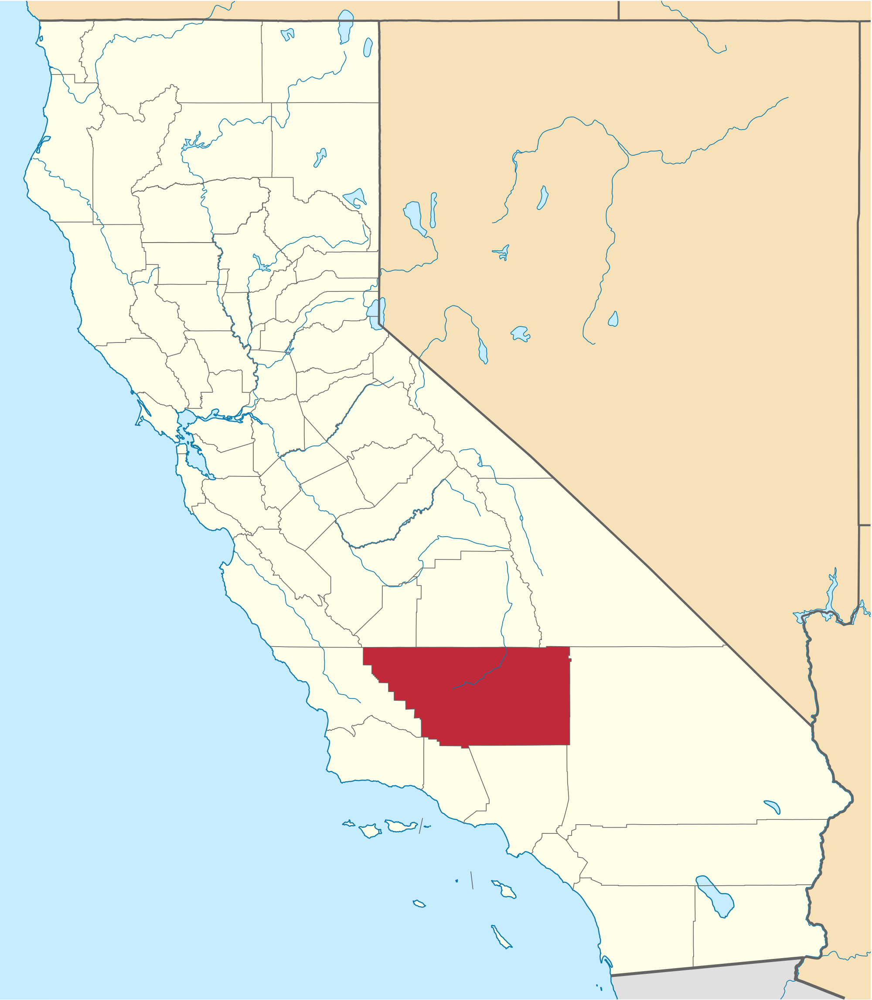

In [2]:
Image(filename = 'KCmap.png', height = 500, width = 500)

## Accessing Public Data

Produced Pond list for 2018 found at https://www.waterboards.ca.gov/centralvalley/water_issues/oil_fields/information/disposal_ponds/
<p>Kern county GAMA chemical measurements: http://geotracker.waterboards.ca.gov/gama/datadownload</p>
>This notebook uses the "All Data" download for Kern County which includes 245 chemical constituents and 100+ years of sample points<br>
<p>Kern County TDS measurements also available at http://geotracker.waterboards.ca.gov/gama/gamamap/public/

In [3]:
#read in produced pond list with locations using pandas
prod_ponds2018= pd.read_csv('2018_0508_prod_pond_list.csv')
#read in GAMA download with all constituents
data = pd.read_csv('./USGS_GAMA/gama_all_kern.txt', sep='\t', header=0)
#read in GAMA download of just TDS 
alldata_kernTDS = pd.read_csv('allKERN_TDS_dateSplit.csv', parse_dates= True)

### Data file is too big for excel or other text editors so we preview and make some changes for easier script later on.

In [30]:
#rename some columns so they don't have a space in the title 
data = data.rename(columns={'WELL ID': 'WELL_ID', "APPROXIMATE LATITUDE":"LATITUDE", 'APPROXIMATE LONGITUDE':'LONGITUDE'})
#combine latitude and logitude for easier searching later on
data['lat_lon'] = data['LATITUDE'].astype(str) + '_'+ data['LONGITUDE'].astype(str)

In [5]:
#convert data column to datetime format readable by python so it's not just a string
data['DATE'] = pd.to_datetime(data.DATE)
data.head()

,WELL_ID,WELL NAME,LATITUDE,LONGITUDE,CHEMICAL,QUALIFIER,RESULT,UNITS,DATE,DATASET_CAT,DATASET,COUNTY,RB,GW_BASIN_NAME,ASSEMBLY,SENATE
0,W0601510006,1510006-030,35.322076,-118.908736,AS,<,2.0,UG/L,2007-12-12,DDW,DDW,KERN,5,SAN JOAQUIN VALLEY - KERN COUNTY (5-022.14),34,16
1,W0601510006,1510006-030,35.322076,-118.908736,AS,<,2.0,UG/L,2008-01-17,DDW,DDW,KERN,5,SAN JOAQUIN VALLEY - KERN COUNTY (5-022.14),34,16
2,W0601510006,1510006-030,35.322076,-118.908736,AS,NaN,3.8,UG/L,2008-02-25,DDW,DDW,KERN,5,SAN JOAQUIN VALLEY - KERN COUNTY (5-022.14),34,16
3,W0601510006,1510006-030,35.322076,-118.908736,AS,<,2.0,UG/L,2008-03-21,DDW,DDW,KERN,5,SAN JOAQUIN VALLEY - KERN COUNTY (5-022.14),34,16
4,W0601510006,1510006-030,35.322076,-118.908736,AS,<,2.0,UG/L,2008-04-22,DDW,DDW,KERN,5,SAN JOAQUIN VALLEY - KERN COUNTY (5-022.14),34,16


## Produced pond and measurement locations
Now we want to create a map to see where the produced ponds are located in relation to available TDS measurements.

In [6]:
#drop rows that have null values for any date column
alldata_kernTDS = alldata_kernTDS.dropna(subset =['MONTH', 'DAY', 'YEAR'])

#change year column from float to integer
alldata_kernTDS['YEAR'] =alldata_kernTDS.YEAR.astype(int)

http://server.arcgisonline.com/ArcGIS/rest/services/ESRI_StreetMap_World_2D/MapServer/export?bbox=-13391734.74243081,4136735.049397425,-13135699.913606282,4300621.372044271&bboxSR=3785&imageSR=3785&size=1500,960&dpi=96&format=png32&transparent=true&f=image


<Figure size 432x288 with 0 Axes>

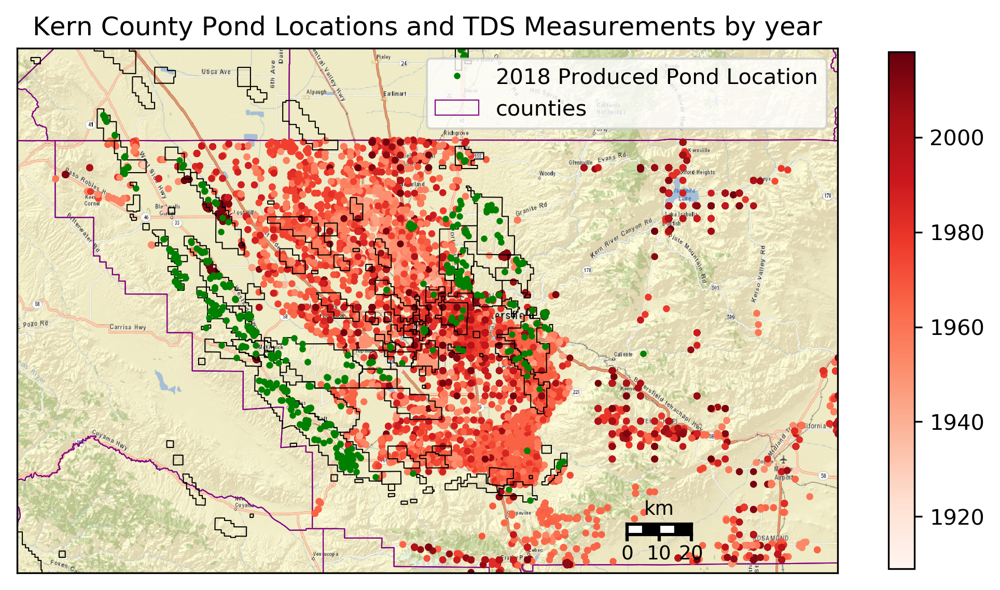

In [7]:
plt.clf()

#choose color ramp to be used
cmap = plt.get_cmap('Reds')

#choose figure size and boundaries of map
plt.figure(figsize= (8.5,11), dpi = 300)
m = Basemap(llcrnrlon = -120.3 , llcrnrlat = 34.8, urcrnrlon = -118, urcrnrlat = 36, epsg=3785)


#draw county line and map scale
m.drawcounties(linewidth=0.5, color='purple')
m.drawmapscale(-118.5, 34.9, -118.5, 35, 20, barstyle ='fancy')

#read in field boundary shapefile obtained from DOGGR website
m.readshapefile('Field_Boundaries', "FieldBoundaries")

#map onto street map found at http://server.arcgisonline.com/arcgis/rest/services
m.arcgisimage(service ='ESRI_StreetMap_World_2D', xpixels = 1500 , ypixels =  None, verbose= True)

#project points for TDS and ponds
x,y = m(alldata_kernTDS.LONGITUDE.values,alldata_kernTDS.LATITUDE.values)
x1,y1 = m(prod_ponds2018.Longitude.values, prod_ponds2018.Latitude.values)

#plot TDS and ponds
plt.scatter(x,y, c=alldata_kernTDS.YEAR, cmap=cmap, s=5)
plt.plot(x1,y1, 'go', markersize =2, label= '2018 Produced Pond Location')

#put legend in top right and add title
plt.legend(loc=1)
plt.title('Kern County Pond Locations and TDS Measurements by year')
# include colorbar and make sure it fits within figure
plt.colorbar(shrink=0.4)

plt.show()
plt.close()

### Bounds for Salinity Values
Plotting by concentration using a basic colormap leaves most data points washed out due to high range in measurements. Instead, we create bins for TDS concentration which allow us to get a better idea of where high values are located.

What's the range of TDS concentration that we're looking at?

In [8]:
print("Highest TDS concentration=", (max(alldata_kernTDS.RESULT)))
print("Lowest TDS concentration=", (min(alldata_kernTDS.RESULT)))
print("Median TDS concenctration=", alldata_kernTDS['RESULT'].median())

Highest TDS concentration= 231000.0
Lowest TDS concentration= 0.0
Median TDS concenctration= 345.0


Now that we have an idea of what there is, we can map it to see how concentration changes spatially. 
<p> Plotting the concentration by a simple gradient made it hard to see all points so bins were made to set specific colors

In [9]:
#separate bins of values for different colors
bin1 = alldata_kernTDS.loc[(alldata_kernTDS.RESULT > 0) & (alldata_kernTDS.RESULT <= 500)]
bin2 = alldata_kernTDS.loc[(alldata_kernTDS.RESULT > 500) & (alldata_kernTDS.RESULT <= 1000)]
bin3 = alldata_kernTDS.loc[(alldata_kernTDS.RESULT > 1000) & (alldata_kernTDS.RESULT <= 1500)]
bin4 = alldata_kernTDS.loc[(alldata_kernTDS.RESULT > 1500) & (alldata_kernTDS.RESULT <= 3000)]
bin5 = alldata_kernTDS.loc[(alldata_kernTDS.RESULT > 3000) & (alldata_kernTDS.RESULT <= 10000)]
bin6 = alldata_kernTDS.loc[(alldata_kernTDS.RESULT > 10000) & (alldata_kernTDS.RESULT <= 100000)]
bin7 = alldata_kernTDS.loc[(alldata_kernTDS.RESULT > 100000) & (alldata_kernTDS.RESULT <= 250000)]

http://server.arcgisonline.com/ArcGIS/rest/services/ESRI_StreetMap_World_2D/MapServer/export?bbox=-13391734.74243081,4136735.049397425,-13135699.913606282,4300621.372044271&bboxSR=3785&imageSR=3785&size=1500,960&dpi=96&format=png32&transparent=true&f=image


Text(0.5,1,'TDS concentration (mg/L) of Kern County')

<Figure size 432x288 with 0 Axes>

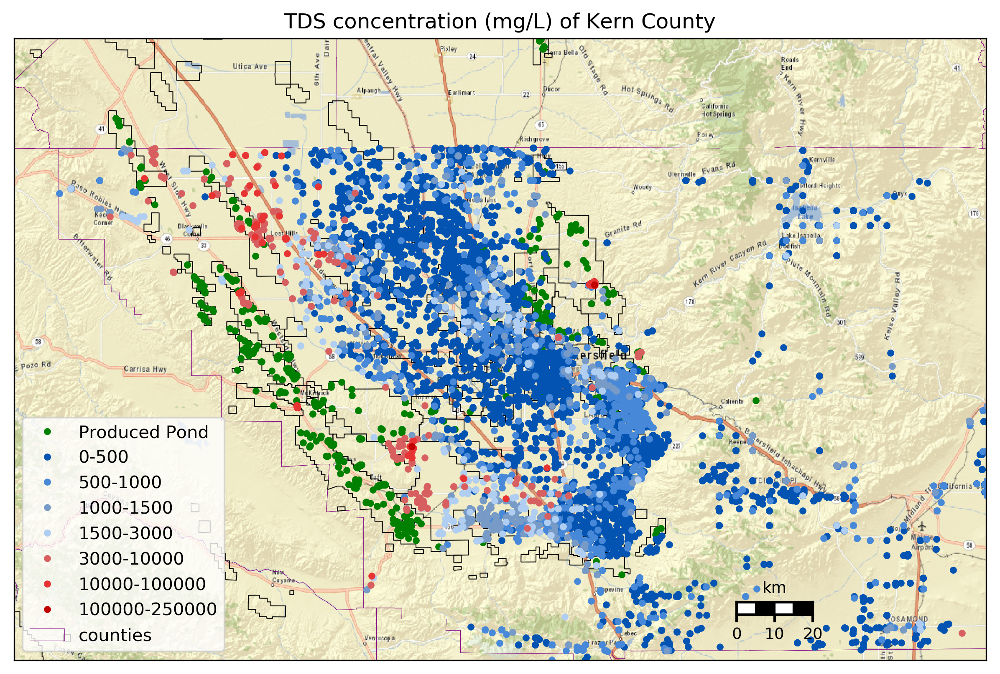

In [10]:
plt.clf()

plt.figure(figsize=(10,10),dpi=300) #make map big enough to see
m = Basemap(llcrnrlon=-120.3,llcrnrlat=34.8,urcrnrlon=-118,urcrnrlat=36, epsg=3785) #choose map and area to visualize
m.arcgisimage(service='ESRI_StreetMap_World_2D', xpixels = 1500,ypixels =None, verbose= True) #adding GIS satellite map for clear viewing
m.readshapefile('Field_Boundaries', "FieldBoundaries") #add oilfield boundaries
m.drawcounties(linewidth=0.2, color='purple') #draw county lines
m.drawmapscale(-118.5, 34.9, -118.5, 35, 20, barstyle ='fancy') # draw map scale

#project ponds and measurements to be mapped
x1,y1 = m(prod_ponds2018.Longitude.values, prod_ponds2018.Latitude.values)
x2,y2 = m(bin1.LONGITUDE.values, bin1.LATITUDE.values)
x3,y3 = m(bin2.LONGITUDE.values, bin2.LATITUDE.values)
x4,y4 = m(bin3.LONGITUDE.values, bin3.LATITUDE.values)
x5,y5 = m(bin4.LONGITUDE.values, bin4.LATITUDE.values)
x6,y6 = m(bin5.LONGITUDE.values, bin5.LATITUDE.values)
x7,y7 = m(bin6.LONGITUDE.values, bin6.LATITUDE.values)
x8,y8 = m(bin7.LONGITUDE.values, bin7.LATITUDE.values)

#actually plot ponds and measurements
plt.plot(x1,y1, 'go', markersize =3, label= 'Produced Pond')
plt.plot(x2,y2,'o', color ='#0353b2',markersize = 3, label = '0-500')
plt.plot(x3,y3,'o', color ='#4789d8',markersize = 3, label = '500-1000')
plt.plot(x4,y4,'o', color ='#779bc6',markersize = 3, label = '1000-1500')
plt.plot(x5,y5,'o', color ='#b0cef2',markersize = 3, label = '1500-3000')
plt.plot(x6,y6,'o', color ='#d85f5f',markersize = 3, label = '3000-10000')
plt.plot(x7,y7,'o', color ='#e83333',markersize = 3, label = '10000-100000')
plt.plot(x8,y8,'o', color ='#c10000',markersize = 3, label = '100000-250000')  

#make the figure pretty
plt.legend()
plt.title('TDS concentration (mg/L) of Kern County')

We can see that TDS is generally higher to the west. This is most likely due to geological processes. The western side of the valley is composed of marine sediments which undergo geochemical reactions and produce higher salinity water.

## Mann-Kendall (MK) Statistical Test
Now that we know where our ponds and TDS measurements are, we can begin to analyze them. We've chosen to use a Mann-Kendall test on locations with 3 or more data points. 

Code available: http://michaelpaulschramm.com/2015/08/01/simple-time-series-trend-analysis/
> Code pasted below for transparency

In [11]:
import numpy as np  
from scipy.stats import norm, mstats


def mk_test(x, alpha = 0.05):  
    """   
    Input:
        x:   a vector of data
        alpha: significance level (0.05 default)

    Output:
        trend: tells the trend (increasing, decreasing or no trend)
        h: True (if trend is present) or False (if trend is absence)
        p: p value of the significance test
        z: normalized test statistics 

    Examples
    --------
      >>> x = np.random.rand(100)
      >>> trend,h,p,z = mk_test(x,0.05) 
    """
    n = len(x)

    # calculate S 
    s = 0
    for k in range(n-1):
        for j in range(k+1,n):
            s += np.sign(x[j] - x[k])

    # calculate the unique data
    unique_x = np.unique(x)
    g = len(unique_x)

    # calculate the var(s)
    if n == g: # there is no tie
        var_s = (n*(n-1)*(2*n+5))/18
    else: # there are some ties in data
        tp = np.zeros(unique_x.shape)
        for i in range(len(unique_x)):
            tp[i] = sum(unique_x[i] == x)
        var_s = (n*(n-1)*(2*n+5) + np.sum(tp*(tp-1)*(2*tp+5)))/18

    if s>0:
        z = (s - 1)/np.sqrt(var_s)
    elif s == 0:
            z = 0
    elif s<0:
        z = (s + 1)/np.sqrt(var_s)

    # calculate the p_value
    p = 2*(1-norm.cdf(abs(z))) # two tail test
    h = abs(z) > norm.ppf(1-alpha/2) 

    if (z<0) and h:
        trend = 'decreasing'
    elif (z>0) and h:
        trend = 'increasing'
    else:
        trend = 'no trend'

    return trend, h, p, z

Here we can test that the MK function works and see what the output is

In [12]:
x = np.random.rand(100)

mk_test(x, 0.5)

('no trend', False, 0.8001600861448428, 0.2531399269503094)

To speed things up, we reduce the data file down to only TDS measurements

In [15]:
TDS = data.loc[(data.DATE > '1900') & (data.CHEMICAL == 'TDS')]
### merge lat/ long columns for easy searching later on
TDS['lat_lon'] = TDS['LATITUDE'].astype(str) + '_'+ TDS['LONGITUDE'].astype(str)

c:\users\valeriepetela\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


Groupby unique location and well ID to be sure we're not looking at multiple calculations for the same point. 

In [16]:
#add a column that counts how many samples are in a group
TDS['COUNT'] = TDS.groupby(['lat_lon'])['WELL_ID'].transform('count')

c:\users\valeriepetela\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


Only look at wells with 3 or more sample points for TDS.

In [17]:
trend = TDS.loc[TDS.COUNT >= 3]

Drop duplicates because groupby function adds count to every row 

In [18]:
trend = trend.drop_duplicates(subset = ['WELL_ID'])

How many trends could exist?

In [19]:
print(len(trend.WELL_ID.unique()), 'wells with 3 or more TDS measurements')

1535 wells with 3 or more TDS measurements


#### Now we can run the MK test on our data
CAUTION: it usually takes a few minutes to run
>results file included with other data files so you can skip this step and work with files

In [20]:
###make list of unique wells with constituents containing 3 or more data points
well_list = trend['WELL_ID'].unique()
###MK test only works on positive values
positive = data.loc[data.RESULT >= 0]

### Open new csv file to write results to
with open('dataChall_trendTest.csv', 'w', newline ='') as csvfile:
    writer = csv.writer(csvfile, quotechar='|',quoting=csv.QUOTE_MINIMAL)
    ### Create header for results csv
    writer.writerow(['WELL_ID','TREND','Presence', 'p-val', 'z'])
    #look at group of wells with chemical and run MK
    for well in well_list:
        try:
            group = positive.groupby(['WELL_ID', 'CHEMICAL']).get_group((well, 'TDS'))
            x = np.array(group.RESULT)
                ### write information to csv file
            writer.writerow([well, mk_test(x, 0.05)])
            ### If well ID is not found in unique list, keep going through loop
        except KeyError:
            continue

### OpenRefine 
This test produces a data sheet that needs a little cleaning to get rid of whitespaces and special characters. This was done in OpenRefine a text editor which can be found at (http://openrefine.org/)

In [35]:
trendTest = pd.read_csv('dataChall_trendTestResults.csv')
trendTest.head()

,WELL_ID,TREND,Presence,p-val,z
0,W0601502030,|('no trend',False,1.000000,0)|
1,W0601510701,|('decreasing',True,0.000220,-3.6948303200820756)|
2,W0601500455,|('no trend',False,0.815745,-0.2330206912141852)|
3,W0601500495,|('no trend',False,0.395489,0.8497058314499201)|
4,W0601510038,|('no trend',False,0.698756,0.3870000463968843)|


Once the sheet is cleaned up, we can read in the results for visualization and analysis

In [23]:
trendTest = pd.read_csv('clean_TDS.csv')
trendTest.head()

,WELL_ID,Trend,Presence,p-value,z
0,W0601510006,no trend,False,0.126723,1.527153
1,W0601510003,decreasing,True,0.003541,-2.916361
2,W0601510031,no trend,False,0.058628,-1.890973
3,W0601510055,no trend,False,0.458403,0.741480
4,W0601510022,no trend,False,0.764060,-0.300153


We're only interested in looking at wells where a trend existed (increasing or decreasing) so we ignore the rest

In [24]:
#filter so we don't have wells where there is no trend
tds_trend = trendTest.loc[trendTest.Trend != 'no trend']
print('# of wells with trends', len(tds_trend))
tds_trend.head()

# of wells with trends 140


,WELL_ID,Trend,Presence,p-value,z
1,W0601510003,decreasing,True,0.003541,-2.916361
5,W0601510005,increasing,True,0.003189,2.948937
8,W0601510701,decreasing,True,0.000220,-3.694830
14,W0601500371,increasing,True,0.000002,4.802725
17,W0601510052,decreasing,True,0.000246,-3.666759


Trend discovery method did not include location of well so it must be added into dataframe for visualization

In [25]:
tds = tds_trend.WELL_ID.values
### loop searches for lat and long in original data files and adds columns
for index, row in tds_trend.iterrows():
    if any(tds) == any(data.WELL_ID):
        tds_trend['LATITUDE'] = data.LATITUDE
        tds_trend['LONGITUDE'] = data.LONGITUDE
### merge lat/ long columns for easy searching later on
tds_trend['lat_lon'] = tds_trend['LATITUDE'].astype(str) + '_'+ tds_trend['LONGITUDE'].astype(str)

tds_trend.head()

c:\users\valeriepetela\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """
c:\users\valeriepetela\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
c:\users\valeriepetela\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = 

,WELL_ID,Trend,Presence,p-value,z,LATITUDE,LONGITUDE,lat_lon
1,W0601510003,decreasing,True,0.003541,-2.916361,35.322076,-118.908736,35.3220755000008_-118.90873600000099
5,W0601510005,increasing,True,0.003189,2.948937,35.322076,-118.908736,35.3220755000008_-118.90873600000099
8,W0601510701,decreasing,True,0.000220,-3.694830,35.322076,-118.908736,35.3220755000008_-118.90873600000099
14,W0601500371,increasing,True,0.000002,4.802725,35.322076,-118.908736,35.3220755000008_-118.90873600000099
17,W0601510052,decreasing,True,0.000246,-3.666759,35.322076,-118.908736,35.3220755000008_-118.90873600000099


Plot trend locations on map to see if there are any close to ponds.

http://server.arcgisonline.com/ArcGIS/rest/services/ESRI_StreetMap_World_2D/MapServer/export?bbox=-13391734.74243081,4136735.049397425,-13135699.913606282,4300621.372044271&bboxSR=3785&imageSR=3785&size=1500,960&dpi=96&format=png32&transparent=true&f=image


<Figure size 432x288 with 0 Axes>

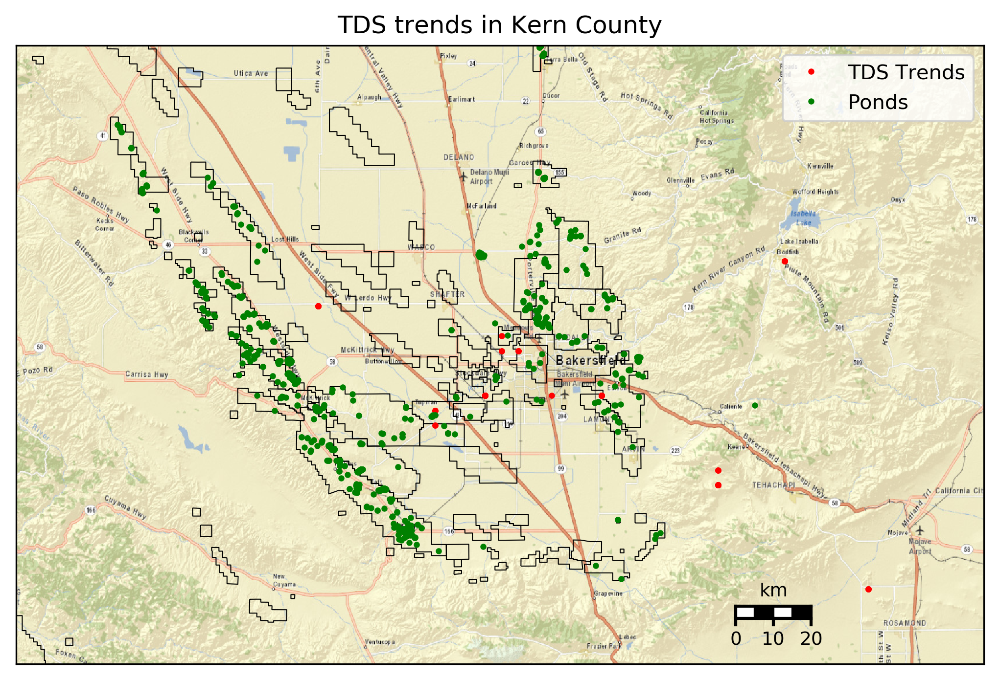

In [26]:
plt.clf()

fig = plt.figure(figsize= (8.5,111), dpi = 300)
m = Basemap(llcrnrlon = -120.3 , llcrnrlat = 34.8, urcrnrlon = -118, urcrnrlat = 36, epsg=3785)
m.readshapefile('Field_Boundaries', "FieldBoundaries")
m.arcgisimage(service ='ESRI_StreetMap_World_2D', xpixels = 1500 , ypixels =  None, verbose= True)
m.drawmapscale(-118.5, 34.9, -118.5, 35, 20, barstyle ='fancy')

x1,y1 = m(tds_trend.LONGITUDE.values, tds_trend.LATITUDE.values)
x2,y2 = m(prod_ponds2018.Longitude.values, prod_ponds2018.Latitude.values)

plt.plot(x1,y1, 'ro', markersize =2, label= 'TDS Trends')
plt.plot(x2,y2, 'go', markersize =2, label= 'Ponds')

plt.legend(loc=1)
plt.title('TDS trends in Kern County')

plt.show()
plt.close()

## Why are there 140 wells but only a few showing up?

### Check out data and trend files to see why

Original data file shows different number of well ID, name, and location. This means that wells do not have a unique identifier in GAMA download. Is this due to different agencies having their own names? Nested wells? Data entry errors? Different GPS tools? What in the sheet is unique?

In [31]:
print('unique well names', len(data['WELL NAME'].unique()))
print('unique well ID', len(data.WELL_ID.unique()))
print('unique location', len(data.lat_lon.unique()))

unique well names 8588
unique well ID 6881
unique location 7348


There are only 14 unique coordinates that have a trend so there are 140 different well ID for 14 locations. 

In [32]:
print('# of unique locations', len(tds_trend.lat_lon.unique()))

# of unique locations 14


## TDS Concentration over time
Now that we know several places where TDS is changing over time, let's take a closer look.

Text(0,0.5,'Concentration (mg/L)')

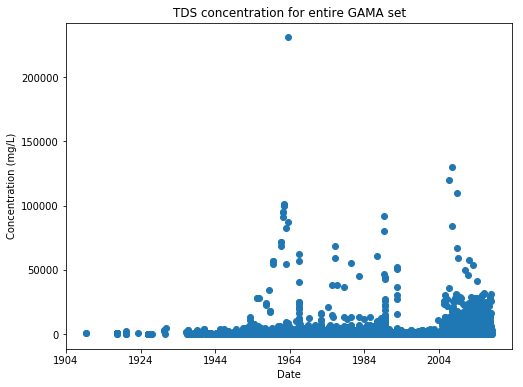

In [33]:
#create a plot of TDS concentration and time
plt.figure(figsize =(8,6))
plt.plot(TDS.DATE, TDS.RESULT,'o')
# make figure pretty
plt.title('TDS concentration for entire GAMA set')
plt.xlabel('Date')
plt.ylabel('Concentration (mg/L)')

We know there are 140 trends so let's look at how TDS concentration changes over time for a couple of those

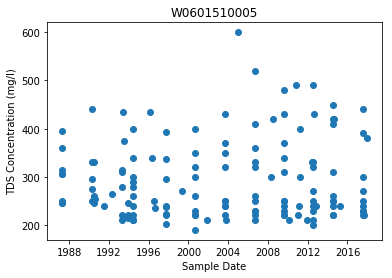

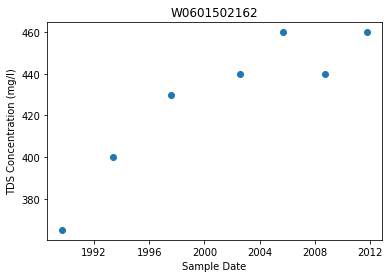

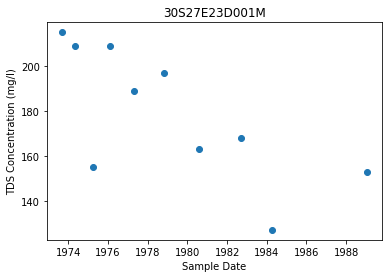

In [34]:
locations = ['W0601510005','W0601502162','30S27E23D001M' ]

for l in locations:
    new = TDS.loc[TDS.WELL_ID == '{}'.format(l)]
    fig, ax = plt.subplots()
    ax.plot(new.DATE, new.RESULT, 'o')
    ax.set_title(l)
    plt.xlabel('Sample Date')
    plt.ylabel('TDS Concentration (mg/l)')

## Summary
This jupyter notebook has utilized public data sources to demonstrate a preliminary analysis of TDS concentration over time in Kern County, California. We have gone over accessing public data and some basic python techniques which have revealed benefits and issues related to current data portals and accessibility. 

Thank you to the agencies who have provided data as well as those in charge of the California Water Data Challenge for contributing to public transparency. 

### *This study is not complete and is used for illustrative purposes only. Any information represented here should be checked for accuracy and any proposed conclusions are not final and are subject to change. Supoprt for this study is provided by the Department of Energy Office of Fossil Energy through the Mickey Leland Energy Fellowship program and research is carried out at Lawrence Berkeley National Laboratory.*

### Contact: vpetela@lbl.gov or valeriepetela@csus.edu